In [23]:
import os
from pathlib import Path
from dataclasses import dataclass
from itertools import combinations
import json

from tqdm import tqdm

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import MDAnalysis as mda
from MDAnalysis.analysis import rms
from MDAnalysis.analysis.dihedrals import Janin

from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.cluster import DBSCAN, KMeans, HDBSCAN
from sklearn.neighbors import NearestNeighbors
from scipy.stats import norm, ttest_ind


from pymol_utils import write_view_system_frame_pml
from stats_utils import statistical_inefficiency_reworked, effective_sample_size_from_g, sem_from_chodera_reworked, ci_from_chodera_reworked, autocorrelation_time, effective_sample_size, bootstrap_confidence_interval
from trajectory_hull_class import ConvexHullFrame, Trajectory
%matplotlib

Using matplotlib backend: module://matplotlib_inline.backend_inline


In [24]:
# Residues implicated in docking poses, 

BINDING_SITE_RESIDUES_onlyRahimova2018 = [
    (366, "A"), (456, "B"), (543, "A"), (543, "B"),                                         # Major H-bond ints in top hits, Fig 6 Rahimova 2018 and text  
    (473, "A"), (473, "B"), (545, "A"), (545, "B"), (471, "A"),                             # Charged residues with non bonding ints, described in text
    (455, "A"), (542, "A"),                                                                 # H-bond ints in Fig 6 with RR6, RR4
    (453, "A"), (453, "B"), (454, "A"), (454, "B"), (544, "A"), (544, "B"),                 # Glycines hydrophobic described in text, Fig 7
]

BINDING_SITE_RESIDUES = [
    (366, "A"), (456, "B"), (543, "A"), (543, "B"), (484, "A"), (484, "B"), (547, "B"),     # Major H-bond ints in top hits, Fig 6 Rahimova 2018 and text  
    (473, "A"), (473, "B"), (545, "A"), (545, "B"), (471, "A"),                             # Charged residues with non bonding ints, described in text
    (455, "A"), (542, "A"),                                                                 # H-bond ints in Fig 6 with RR6, RR4
    (453, "A"), (453, "B"), (454, "A"), (454, "B"), (544, "A"), (544, "B"),                 # Glycines hydrophobic described in text, Fig 7
    (366, "A"), (531, "A"),                                                                 # D366 makes H-bond, Y531 Pi-stack (Grosjean 2025)    
]

dihedral_inspection_sel = [
    (471, "A"), (547, "B"),
    (484, "A"), (484, "B"), (531, "A"), 
    (473, "A"), (456, "B"),
]

BINDING_SITE_RESIDUES_onlyJanins = [
    (366, "A"), (456, "B"), (543, "A"), (543, "B"), (484, "A"), (484, "B"), (547, "B"),     # Major H-bond ints in top hits, Fig 6 Rahimova 2018 and text  
    (473, "A"), (473, "B"), (545, "A"), (545, "B"), (471, "A"),                             # Charged residues with non bonding ints, described in text
    (455, "A"),                                                                             # H-bond ints in Fig 6 with RR6, RR4
    (366, "A"), (531, "A"),  
]

In [25]:
CWD = Path(os.getcwd()).parent

paths = {
    '4h2i': CWD / '4h2i' / 'unbiased',
    '4h2i_noadn': CWD / '4h2i_noadn' / 'unbiased',
    '4h2g': CWD / '4h2g' / 'unbiased',
    '4h2g_noadn': CWD / '4h2g_noadn' / 'unbiased',
    '6tve': CWD / '6tve' / 'unbiased',
    '6twa': CWD / '6twa' / 'unbiased',
}

allosteric_bindingsite_trajectories = {
        "4h2i": Trajectory(paths["4h2i"], paths["4h2i"] / "nosol.pdb", BINDING_SITE_RESIDUES),
        "4h2i_noadn": Trajectory(paths["4h2i_noadn"], paths["4h2i_noadn"] / "nosol.pdb", BINDING_SITE_RESIDUES),
        "4h2g": Trajectory(paths["4h2g"], paths["4h2g"] / "nosol.pdb", BINDING_SITE_RESIDUES),
        "4h2g_noadn": Trajectory(paths["4h2g_noadn"], paths["4h2g_noadn"] / "nosol.pdb", BINDING_SITE_RESIDUES),
        "6tve": Trajectory(paths["6tve"], paths["6tve"] / "nosol.pdb", BINDING_SITE_RESIDUES),
        "6twa": Trajectory(paths["6twa"], paths["6twa"] / "nosol.pdb", BINDING_SITE_RESIDUES)
}

/Users/wes/.local/share/mamba/envs/mdanalysis_210/lib/python3.14/site-packages/MDAnalysis/topology/PDBParser.py:376: UserWarning: Element information is missing, elements attribute will not be populated. If needed these can be guessed using universe.guess_TopologyAttrs(context='default', to_guess=['elements']).
  warnings.warn("Element information is missing, elements attribute "


In [26]:
janin_results = {}

for name, traj in allosteric_bindingsite_trajectories.items():
    print(f"doing trajectory {name}")
    janin_results[name] = {}

    for residue in BINDING_SITE_RESIDUES_onlyJanins:
        residue_key = f"{residue[0]}-{residue[1]}"
        janin_results[name][residue_key] = {}

        janin = Janin(
            traj.universe.select_atoms(f"protein and resid {residue[0]} and segid {residue[1]}")
        )
        print(f"started Janin for {residue}")
        janin.run()

        angles = janin.results.angles[:, 0, :]
        chi1 = list(angles[:, 0])
        chi2 = list(angles[:, 1])

        janin_results[name][residue_key]["chi1"] = chi1
        janin_results[name][residue_key]["chi2"] = chi2



doing trajectory 4h2i
started Janin for (366, 'A')
started Janin for (456, 'B')
started Janin for (543, 'A')
started Janin for (543, 'B')
started Janin for (484, 'A')
started Janin for (484, 'B')
started Janin for (547, 'B')
started Janin for (473, 'A')
started Janin for (473, 'B')
started Janin for (545, 'A')
started Janin for (545, 'B')
started Janin for (471, 'A')
started Janin for (455, 'A')
started Janin for (366, 'A')
started Janin for (531, 'A')
doing trajectory 4h2i_noadn
started Janin for (366, 'A')
started Janin for (456, 'B')
started Janin for (543, 'A')
started Janin for (543, 'B')
started Janin for (484, 'A')
started Janin for (484, 'B')
started Janin for (547, 'B')
started Janin for (473, 'A')
started Janin for (473, 'B')
started Janin for (545, 'A')
started Janin for (545, 'B')
started Janin for (471, 'A')
started Janin for (455, 'A')
started Janin for (366, 'A')
started Janin for (531, 'A')
doing trajectory 4h2g
started Janin for (366, 'A')
started Janin for (456, 'B')


In [27]:
janin_results

{'4h2i': {'366-A': {'chi1': [np.float64(298.34758878385776),
    np.float64(310.77484272080784),
    np.float64(290.36531026184247),
    np.float64(296.8608582271743),
    np.float64(314.24419470917786),
    np.float64(292.26027618229966),
    np.float64(288.06536381588984),
    np.float64(287.28026490626826),
    np.float64(296.9051107999247),
    np.float64(306.22692835863427),
    np.float64(301.71884552631485),
    np.float64(288.74242063023206),
    np.float64(298.5054739492082),
    np.float64(292.47382142987306),
    np.float64(297.3334618314267),
    np.float64(301.35267274098015),
    np.float64(289.08781309944885),
    np.float64(294.1299554828536),
    np.float64(295.86900693347405),
    np.float64(291.69400219834233),
    np.float64(297.32168264966487),
    np.float64(293.52101929086103),
    np.float64(284.303679685842),
    np.float64(288.53958224104053),
    np.float64(297.53003637430277),
    np.float64(293.4129286130301),
    np.float64(294.75061085350984),
    np.floa

In [42]:
# Saving / Loading Janin results as .JSON

#with open("./data/janin_results.json", "w") as f:
#   json.dump(janin_results, f)

# with open("./data/janin_results.json", "w") as f:
#     json.dump(
#         {k: vars(v) for k, v in janin_results.items()},
#         f,
#         indent=2
#     )

# janin_results = json.load(open("./data/janin_results.json"))

# ----------------


# for key, subdict in janin_results.items():
#     with open(f"./data/janin_{key}_results.json", "w") as f:
#         json.dump(subdict, f, indent=2)

janin_4h2i = json.load(open("./data/janins/janin_4h2i_results.json"))
janin_4h2i_noadn = json.load(open("./data/janins/janin_4h2i_noadn_results.json"))
janin_4h2g = json.load(open("./data/janins/janin_4h2g_results.json"))
janin_4h2g_noadn = json.load(open("./data/janins/janin_4h2g_noadn_results.json"))
janin_6tve = json.load(open("./data/janins/janin_6tve_results.json"))
janin_6twa = json.load(open("./data/janins/janin_6twa_results.json"))

janin_results = {
    "42hi": janin_4h2i,
    "4h2i_noadn": janin_4h2i_noadn,
    "4h2g": janin_4h2g,
    "4h2g_noadn": janin_4h2g_noadn,
    "6tve": janin_6tve,
    "6twa": janin_6twa

}

In [39]:
ROTAMERS = {
    "g+": 60,
    "t": 180,
    "g-": 300,
    "syn": 0,
    "syn2": 360
}

def nearest_rotamer(angle):
    # periodic angular distance
    distances = {
        name: min(abs(angle-center), 360-abs(angle-center))
        for name, center in ROTAMERS.items()
    }
    return min(distances, key=distances.get)

def assign_state(chi1, chi2):
    r1 = nearest_rotamer(chi1)
    r2 = nearest_rotamer(chi2)
    return f"{r1}/{r2}"

angles = janin_results["6tve"]["545-A"]

states = [
    assign_state(c1, c2)
    for c1, c2 in zip(angles["chi1"], angles["chi2"])
]

summary = (
    pd.Series(states)
    .value_counts(normalize=True)
    .mul(100)
    .round(2)
)

print(summary)

g-/t     99.69
syn/t     0.30
t/t       0.01
Name: proportion, dtype: float64


In [ ]:
frames_to_mark = [1000, 5000, 18001]

for frame in frames_to_mark:
    x = chi1[frame]
    y = chi2[frame]

    ax.scatter(x, y, color="red", s=60)
    ax.text(x + 5, y + 5, str(frame), color="red")

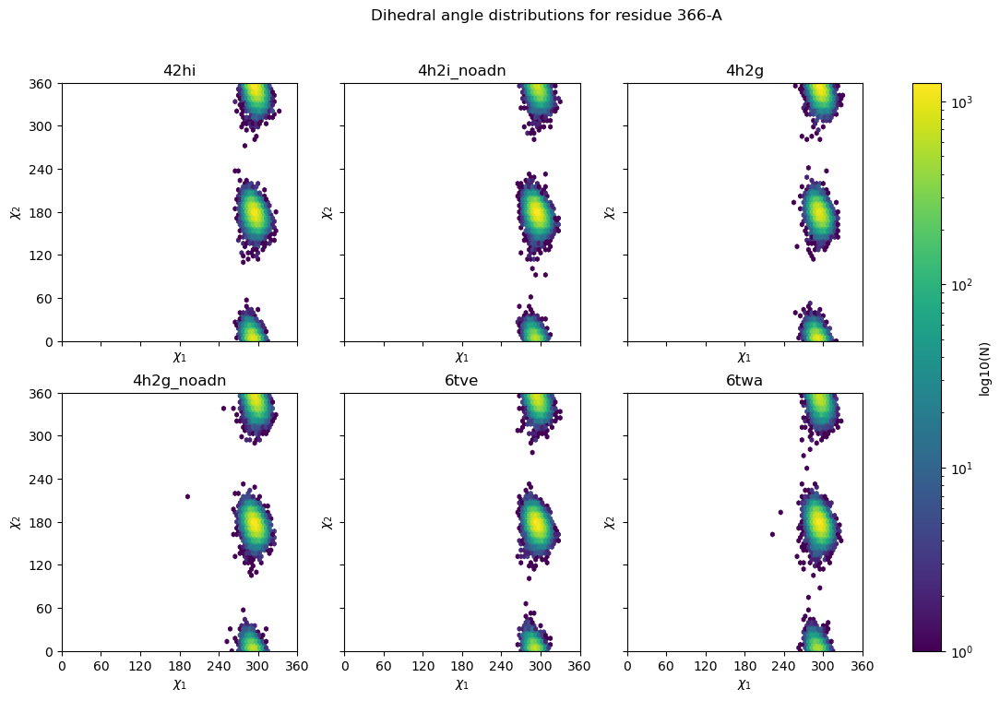

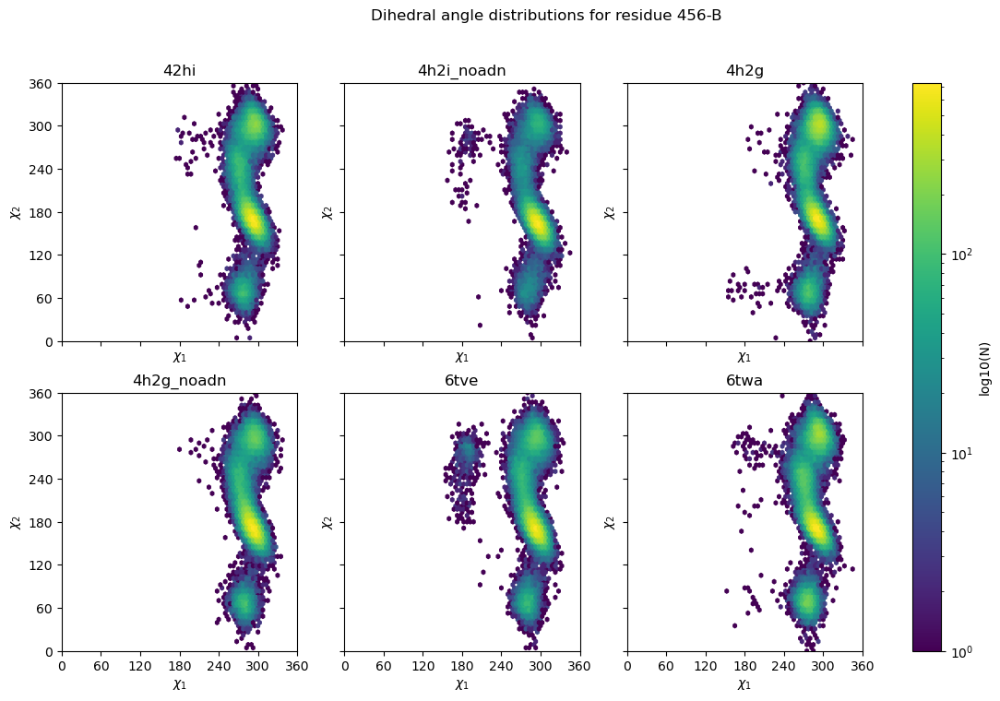

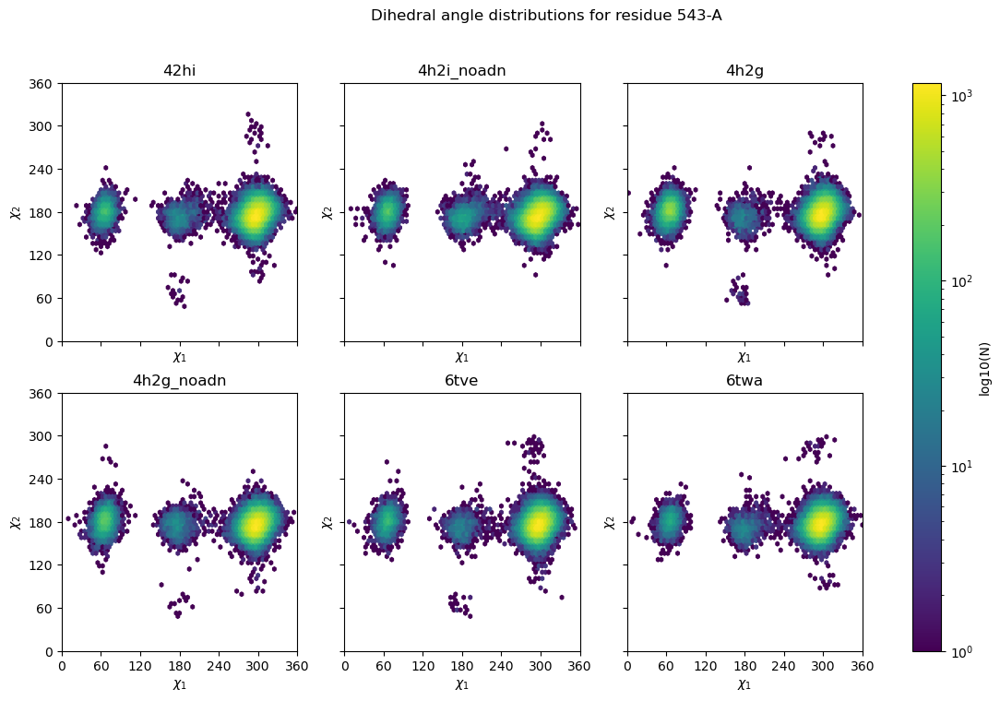

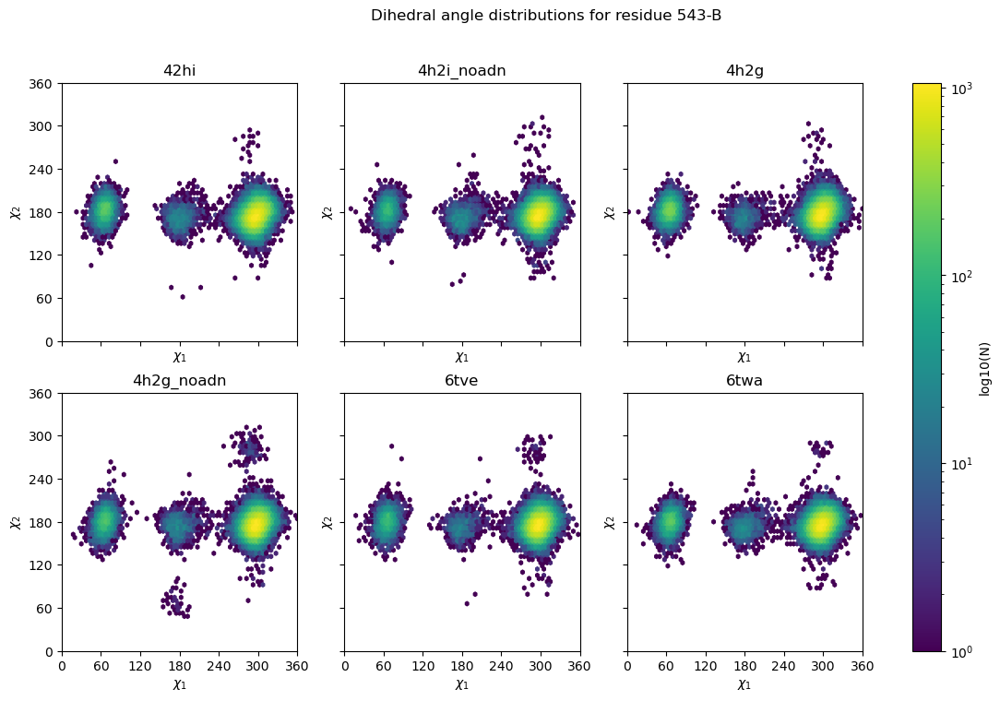

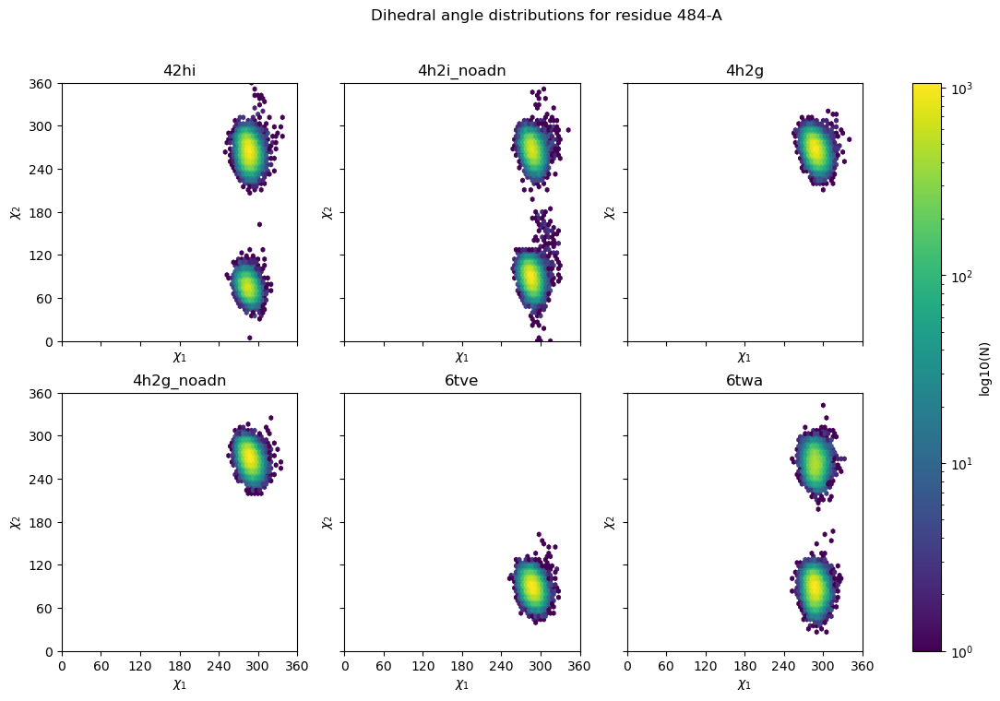

...

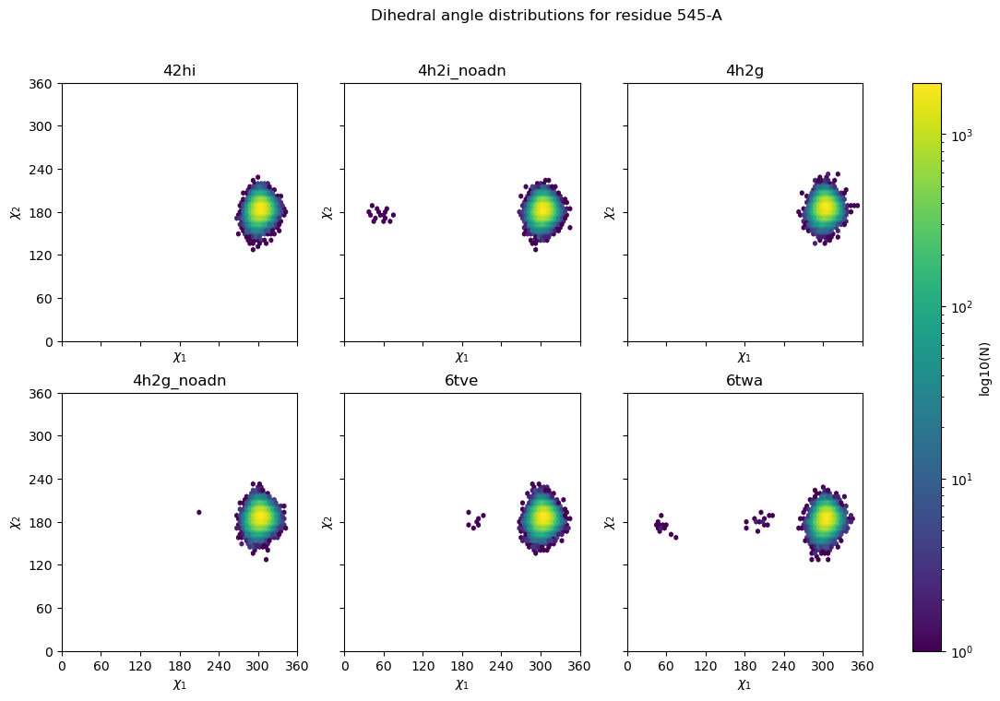

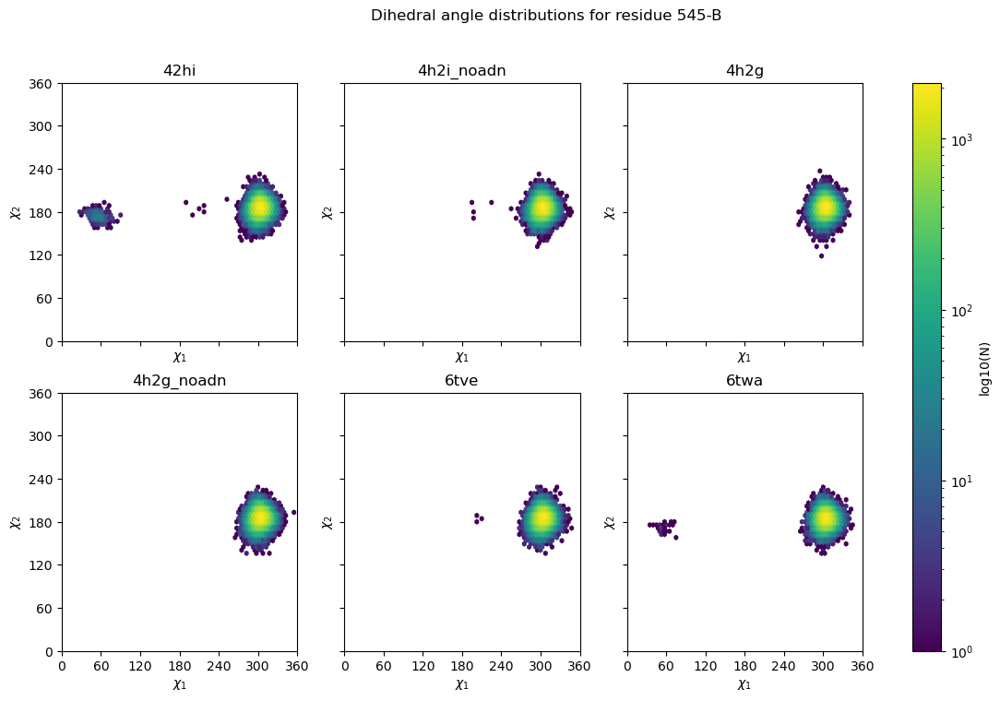

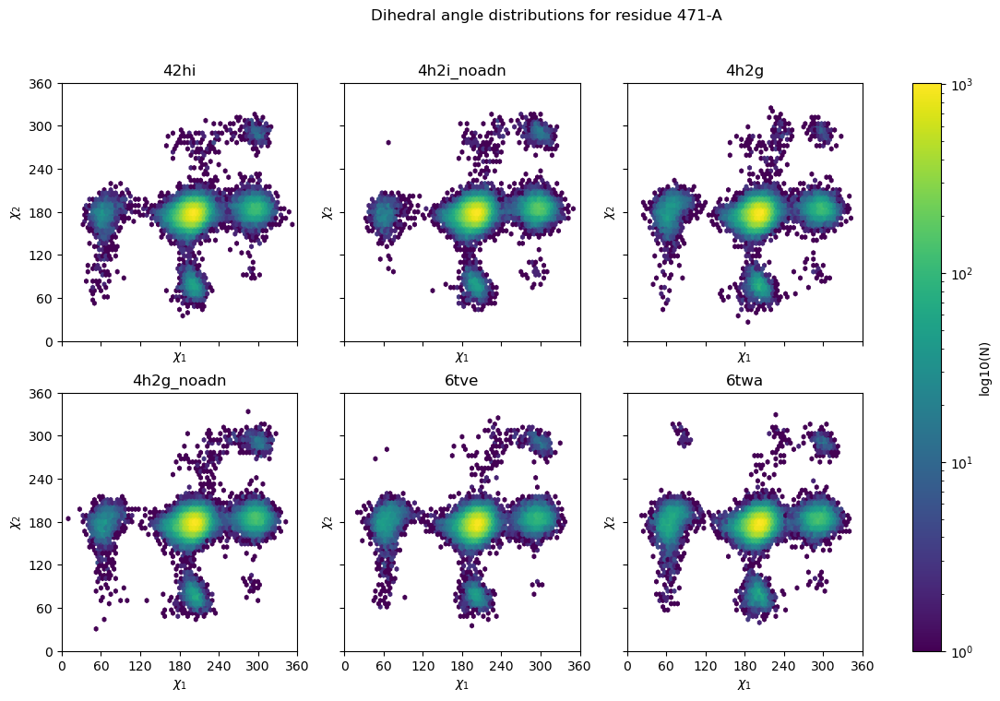

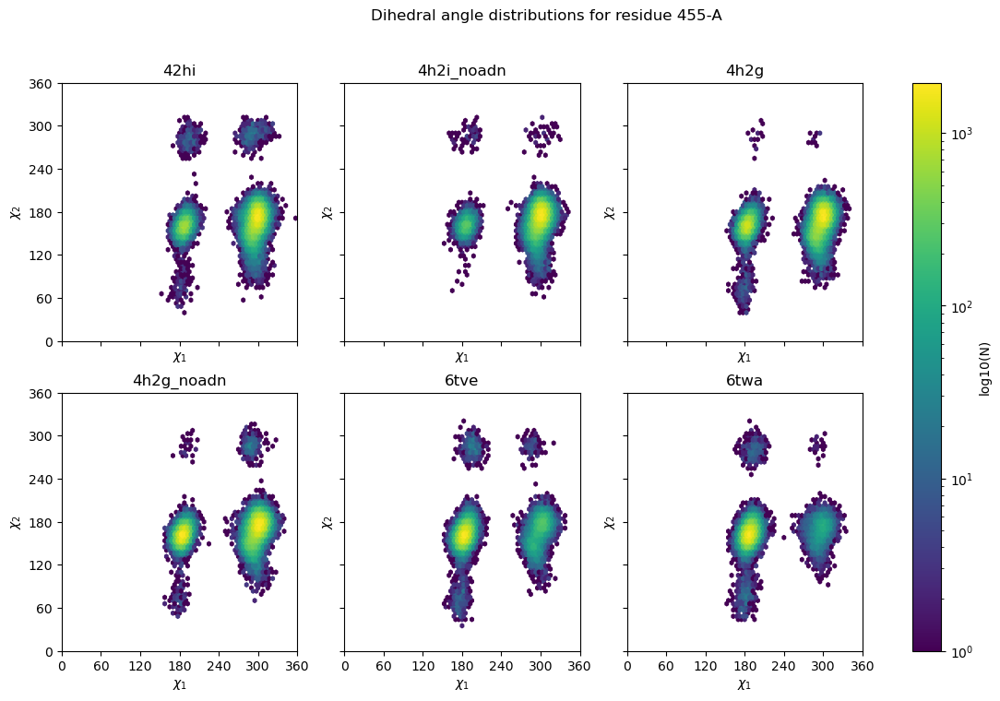

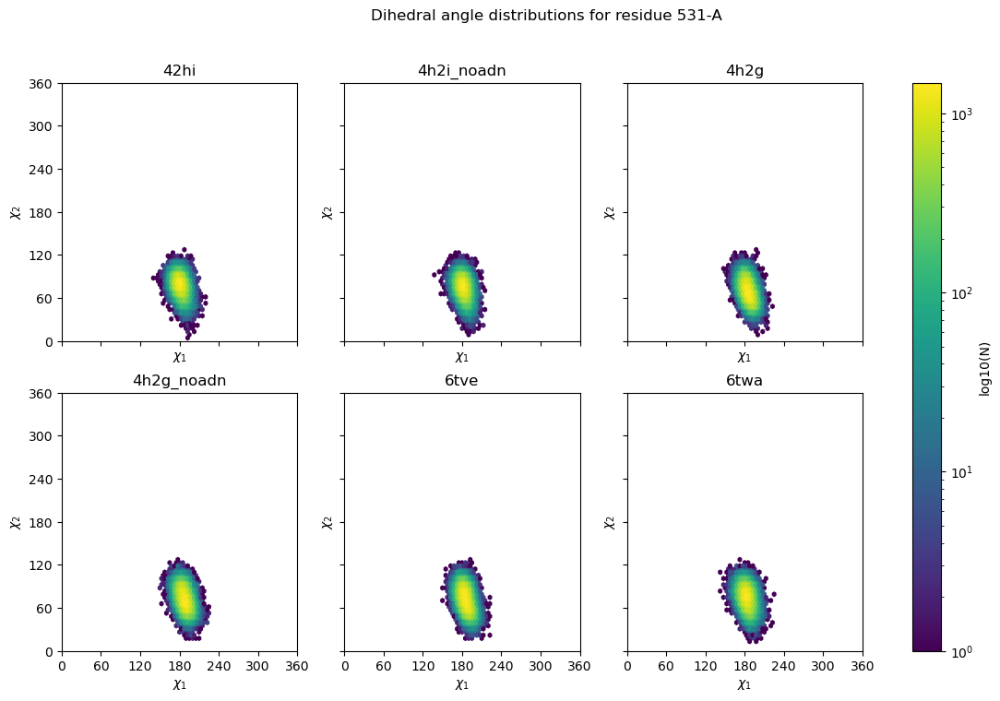

In [73]:
for residue in janin_results['4h2g'].keys():
    fig, axes = plt.subplots(
    2,
    3,
    sharex=True,
    sharey=True,
    figsize=(14,8)
    )

    axes = axes.flatten()

    for ax, name in zip(axes, janin_results.keys()):
    
        angles = janin_results[name][residue]
        chi1 = angles['chi1']
        chi2 = angles['chi2']

        hb = ax.hexbin(
            chi1,
            chi2,
            gridsize=72,
            bins="log",
            extent=(0,360,0,360)
        )

        ax.set_title(name)
        ax.set_xlim(0,360)
        ax.set_ylim(0,360)
        ax.set_xticks([0, 60, 120, 180, 240, 300, 360])
        ax.set_yticks([0, 60, 120, 180, 240, 300, 360])
        ax.set_xlabel(r"$\chi_1$")
        ax.set_ylabel(r"$\chi_2$") 

    fig.colorbar(hb, ax=axes, label="log10(N)")
    fig.suptitle(f"Dihedral angle distributions for residue {residue}")  
    
    #plt.tight_layout()
    plt.show()

## Janin dihedral analysis for cluster medoids

In [82]:
cluster_medoids_4h2i = [(1, 4001), (2, 18001), (3, 30001), (4, 41001), (5, 45001)]



janin_4h2i['366-A']['chi1']

[298.34758878385776,
 310.77484272080784,
 290.36531026184247,
 296.8608582271743,
 314.24419470917786,
 292.26027618229966,
 288.06536381588984,
 287.28026490626826,
 296.9051107999247,
 306.22692835863427,
 301.71884552631485,
 288.74242063023206,
 298.5054739492082,
 292.47382142987306,
 297.3334618314267,
 301.35267274098015,
 289.08781309944885,
 294.1299554828536,
 295.86900693347405,
 291.69400219834233,
 297.32168264966487,
 293.52101929086103,
 284.303679685842,
 288.53958224104053,
 297.53003637430277,
 293.4129286130301,
 294.75061085350984,
 289.0230477845806,
 297.9878618123087,
 295.7421107921777,
 291.82778956348807,
 298.94410490048534,
 304.5277675860482,
 302.41963146062403,
 303.587514686251,
 286.38190905025,
 291.45532105262185,
 299.2572838274329,
 296.61050768304176,
 294.31222763855266,
 303.57983679930084,
 301.93193854400886,
 298.7540870904684,
 301.35223435691177,
 289.4195614076973,
 294.85075632403436,
 282.31656426181434,
 297.5816791852884,
 283.21063925

In [84]:
for cluster, medoid_idx in cluster_medoids_4h2i:
    print(cluster)
    print(medoid_idx)

1
4001
2
18001
3
30001
4
41001
5
45001


In [85]:
janin_4h2i_medoids = {}

for residue in janin_4h2i.keys():
    janin_4h2i_medoids[residue] = {
          'cluster_index': [],
          'chi1': [],
          'chi2': [],
}

for residue in janin_4h2i_medoids.keys():
    for cluster, medoid_idx in cluster_medoids_4h2i:
            janin_4h2i_medoids[residue]['cluster_index'].append(cluster)
            janin_4h2i_medoids[residue]['chi1'].append(janin_4h2i[residue]['chi1'][medoid_idx])
            janin_4h2i_medoids[residue]['chi2'].append(janin_4h2i[residue]['chi1'][medoid_idx])



In [88]:
cluster_medoids_4h2i

[(1, 4001), (2, 18001), (3, 30001), (4, 41001), (5, 45001)]

In [89]:
for a, b in cluster_medoids_4h2i:
    print(a)
    print(b)

1
4001
2
18001
3
30001
4
41001
5
45001


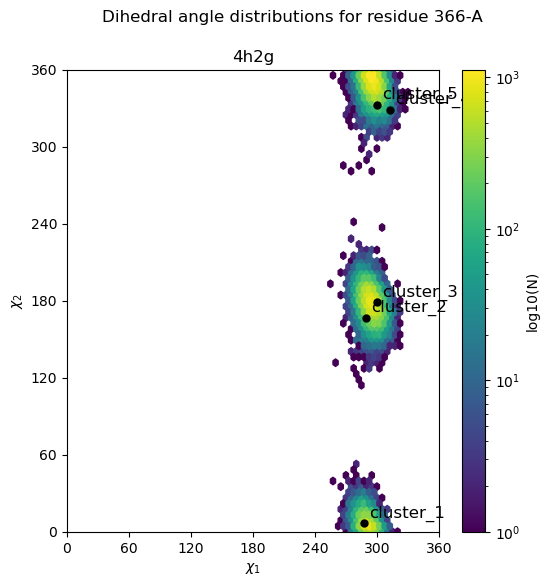

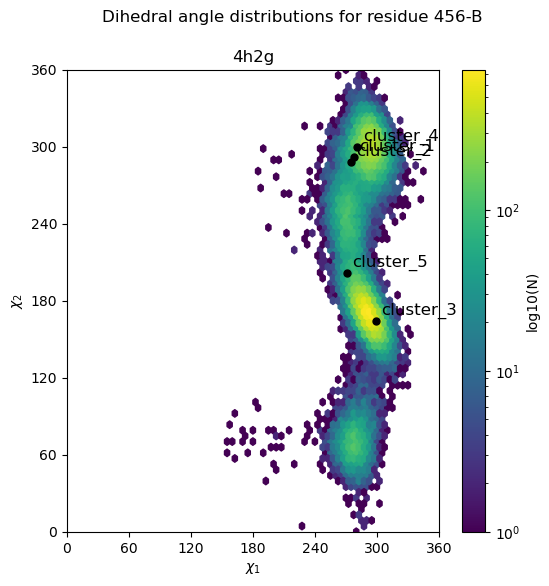

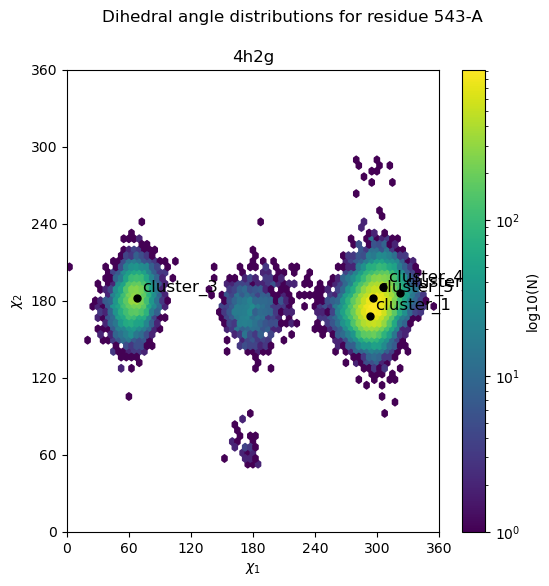

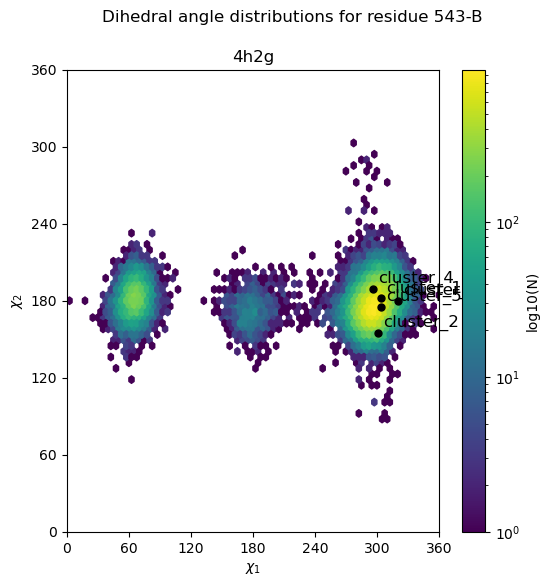

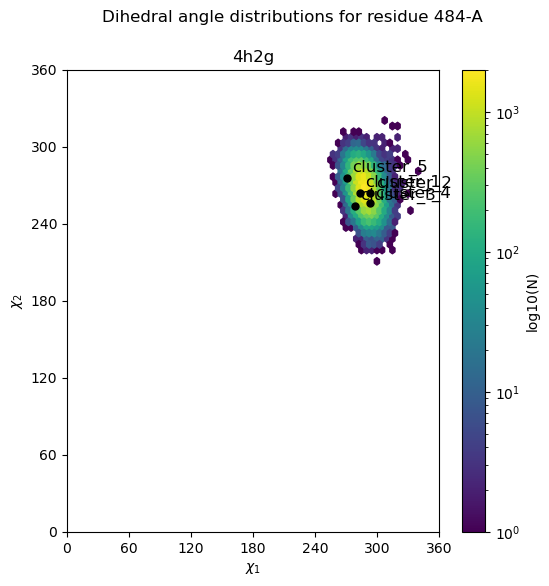

...

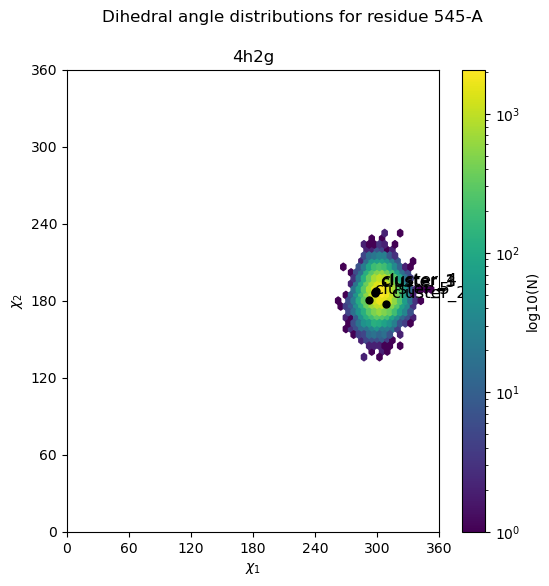

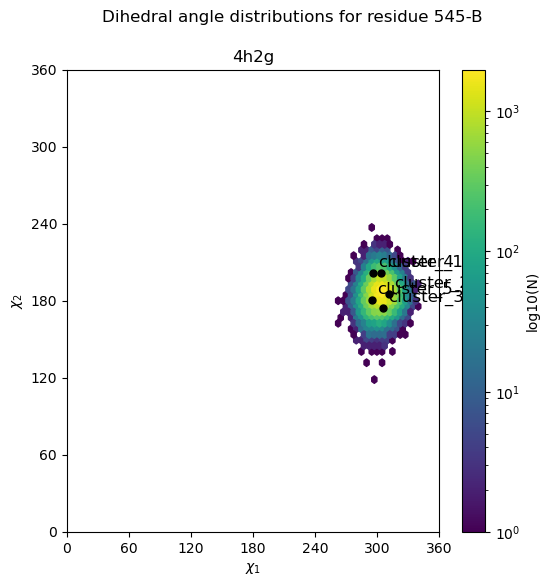

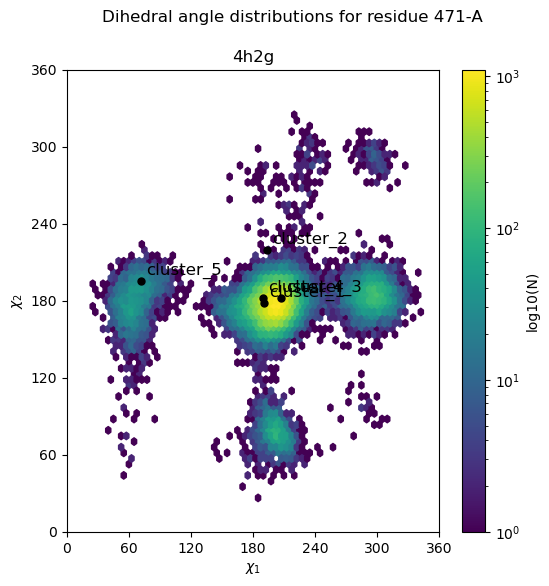

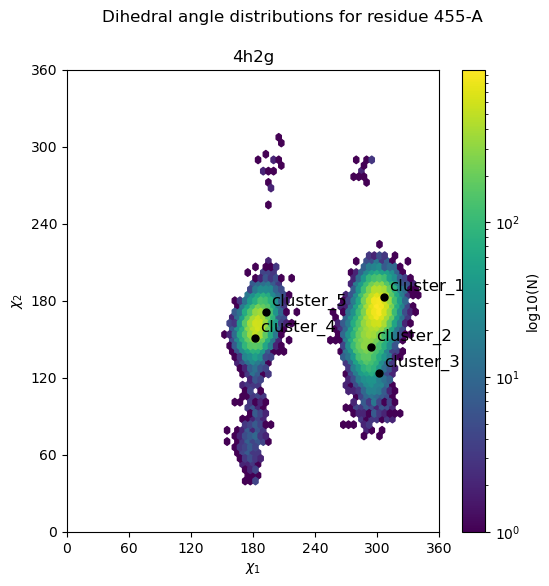

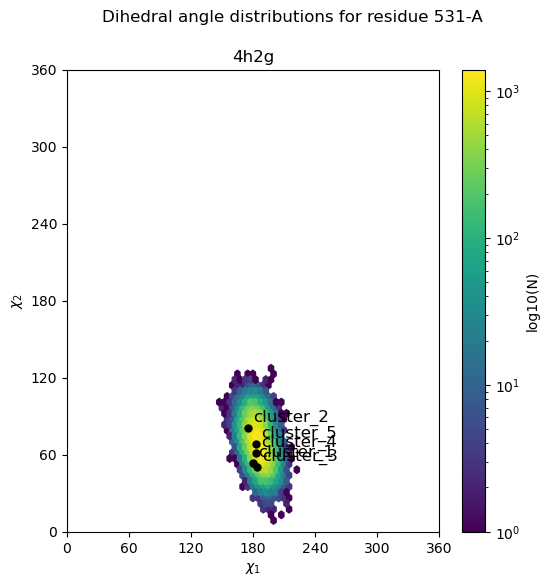

In [92]:
#frames_to_mark = cluster_medoids_4h2i
cluster_number, frames_to_mark = zip(*cluster_medoids_4h2i)

for residue in janin_results['4h2g'].keys():

    fig, ax = plt.subplots(
        1,
        1,
        sharex=True,
        sharey=True,
        figsize=(6,6)
    )

    angles = janin_results['4h2g'][residue]
    chi1 = angles['chi1']
    chi2 = angles['chi2']

    hb = ax.hexbin(
        chi1,
        chi2,
        gridsize=72,
        bins="log",
        extent=(0,360,0,360)
    )

    ax.set_title("4h2g")
    ax.set_xlim(0,360)
    ax.set_ylim(0,360)

    ax.set_xticks([0, 60, 120, 180, 240, 300, 360])
    ax.set_yticks([0, 60, 120, 180, 240, 300, 360])

    ax.set_xlabel(r"$\chi_1$")
    ax.set_ylabel(r"$\chi_2$")

    for cluster_label, frame in cluster_medoids_4h2i:

        # optional bounds check
        if frame >= len(chi1):
            continue

        x = chi1[frame]
        y = chi2[frame]

        ax.scatter(
            x,
            y,
            color="black",
            s=25,
            zorder=10
        )

        ax.text(
            x + 5,
            y + 5,
            f"cluster_{cluster_label}",
            color="black",
            fontsize=12
        )

    fig.colorbar(hb, ax=ax, label="log10(N)")

    fig.suptitle(
        f"Dihedral angle distributions for residue {residue}"
    )

    plt.show()